2024-03-28 11:06:13.667866: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


This song is 30 seconds long.
The sampling rate of this file is: 22050. It represents how many times per second the audio is sampled.
The value "x" represents the wave form of a song, which contains 661794 slices.
The approximate duration of the song is: 30.013333333333332. Which is what we expect since all songs are 30 seconds long.


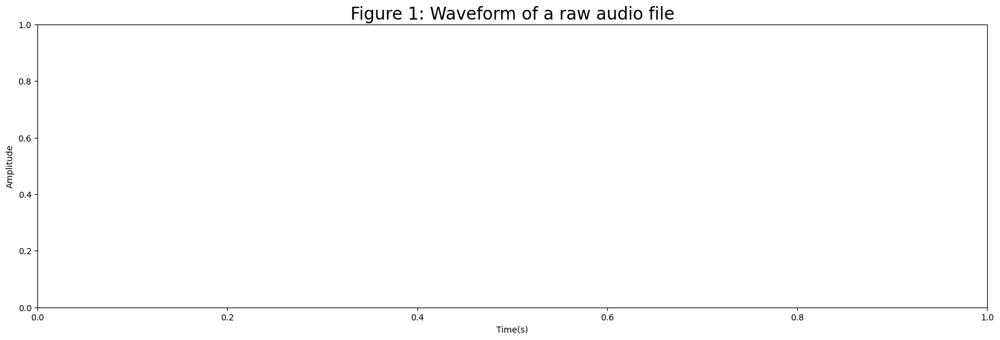

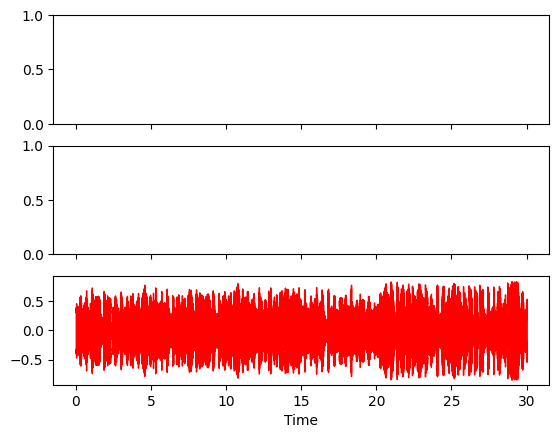

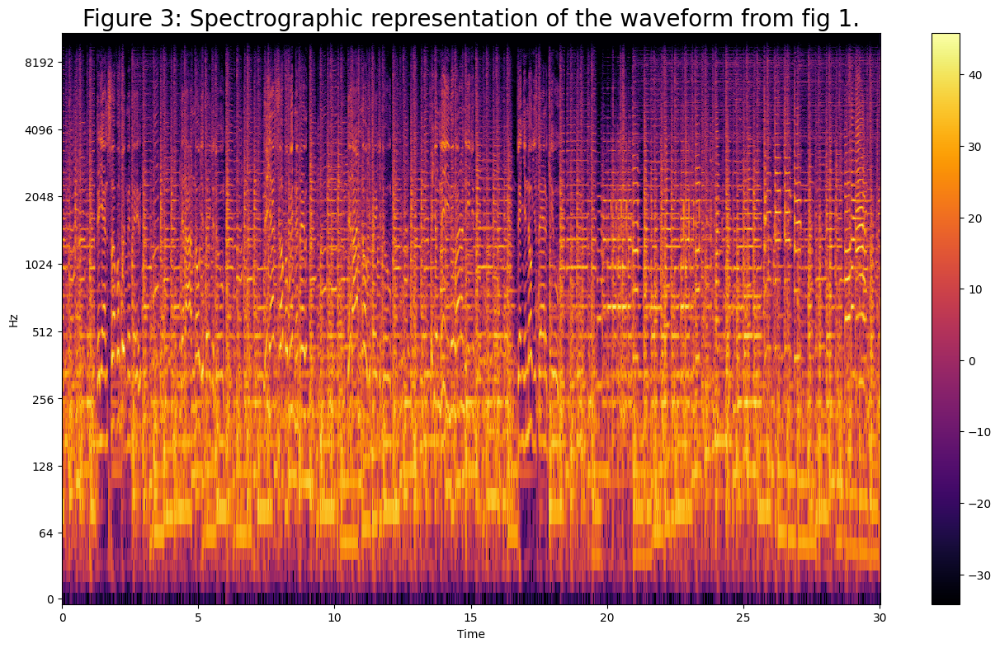

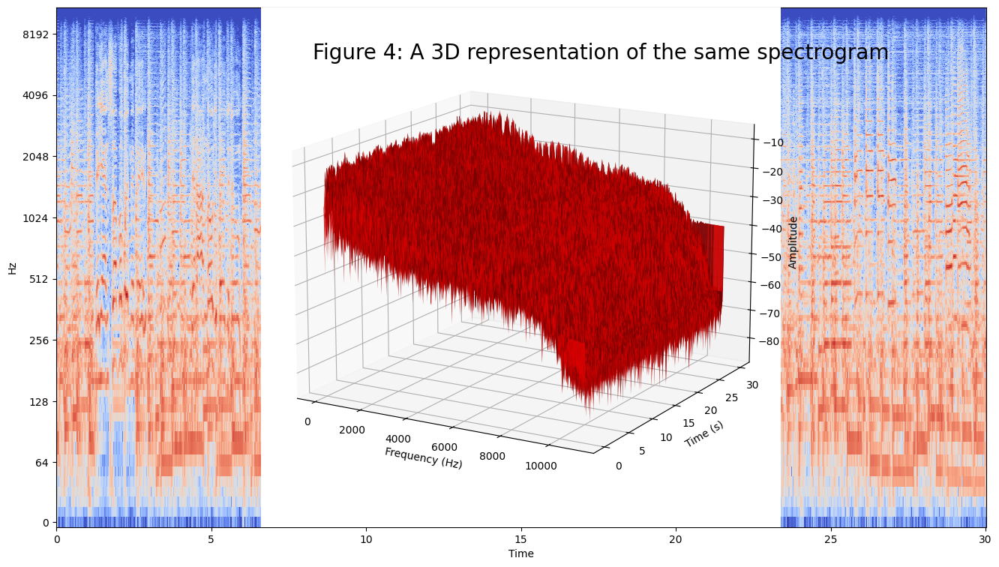

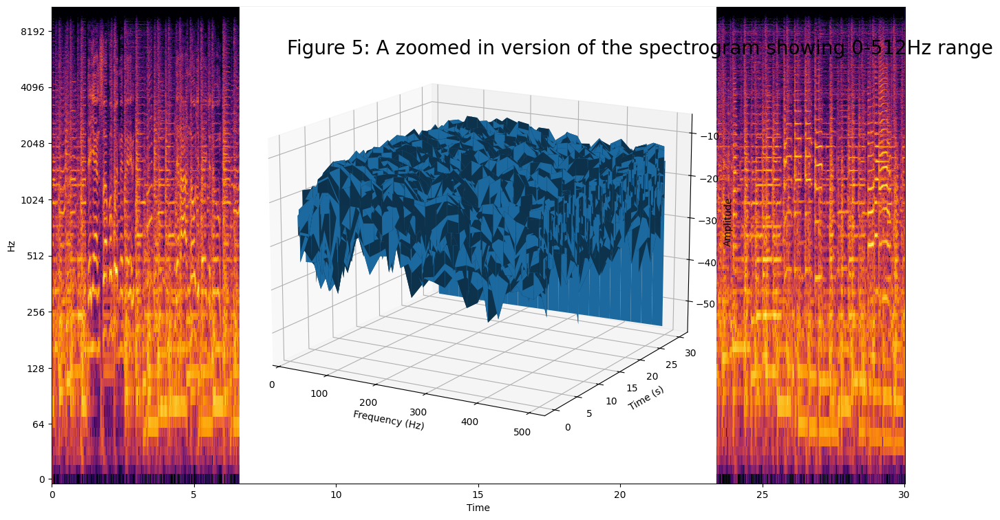

From the image below which represents a small slice of time. The number of crossings 0 is 9 

When this idea of zero crossings is extended to the entire 30 second portion of a song, this song has 50563 zero crossings
From the image below which represents a small slice of time. The number of crossings 0 is 9 



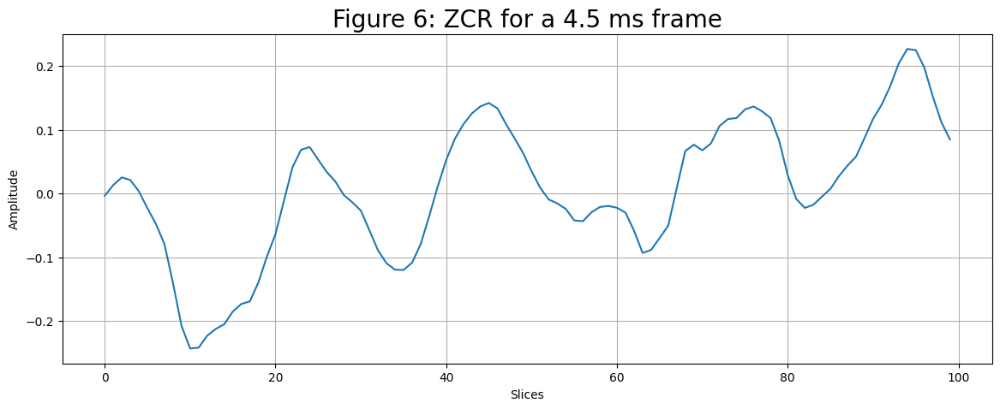

In [2]:

import librosa.display

import librosa
import matplotlib.pyplot as plt
import librosa.display
import sklearn
import datetime
import keras
import statistics
import random
from random import randint
from random import seed
from keras import models
from keras import layers
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from scipy import signal
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.collections import PolyCollection
import numpy as np
import csv
import pandas as pd
import math

##### Step 1. Import the song file


print("This song is 30 seconds long.")
file_path = 'genres_original/blues/blues.00002.wav'

## Load an audio file as a floating point time series.
x , sampling_rate = librosa.load(file_path)


print("The sampling rate of this file is: {0}. It represents how many times ".format(sampling_rate) +
      "per second the audio is sampled.")
print("The value \"x\" represents the wave form of a song, which contains {0} slices.".format(x.shape[0]))
print("The approximate duration of the song is: {0}. Which is what we expect since all songs are 30 seconds long.".format(len(x)/sampling_rate))

## Plot the waveform of the loaded file
plt.figure(figsize=(20, 6))
plt.title("Figure 1: Waveform of a raw audio file",fontdict={'fontsize':20})
plt.xlabel("Time(s)")
plt.ylabel("Amplitude")
fig, ax = plt.subplots(nrows=3, sharex=True)


librosa.display.waveshow(x, sr=sampling_rate , color='red')

##### Apply Short-Time Fourier Transform (STFT) to Decompose Wave Form to base frequencies



## This function converts our file into a time-frequency domain representation using short-time Fourier transform 
## (essentially this is the change of FFT's over time)
wav_form = librosa.stft(x)
S_spectogram, phase_spectogram = librosa.magphase(librosa.stft(y=x))

## Plot the spectrogram of the STFT representation
wav_form_db = librosa.amplitude_to_db(abs(wav_form))
plt.figure(figsize=(16,9))
plt.title("Figure 3: Spectrographic representation of the waveform from fig 1.",fontdict={'fontsize':20})
plt.xlabel("Time(s)")
plt.ylabel("Frequency(Hz)")
librosa.display.specshow(wav_form_db, sr=sampling_rate, x_axis='time', y_axis='log')
plt.colorbar()
plt.inferno()
plt.show()





##Ploting the 3D represenation spectrogram of the SFTF 
f, t, Zxx = signal.stft(x, sampling_rate, nperseg=1025)
Zxx=abs(Zxx)


fig = plt.figure(figsize=(16,9))
librosa.display.specshow(wav_form_db, sr=sampling_rate, x_axis='time', y_axis='log')
#ax = fig.gca(projection='3d')
ax = fig.add_subplot(projection='3d')

ax.text2D(0.1, 0.9, "Figure 4: A 3D representation of the same spectrogram",fontdict={'fontsize':20}, transform=ax.transAxes)
ax.set_prop_cycle(color=['red', 'green', 'blue'])
ax.plot_surface(f[:, None], t[None, :],10.0*np.log10(Zxx),rcount=2046, ccount=2046,)
ax.view_init(15, -60)
ax.set_ylabel('Time (s)')
ax.set_xlabel('Frequency (Hz)')
ax.set_zlabel('Amplitude')
plt.show()

##Ploting the 3D represenation spectrogram of the SFTF in the frequence range of 0-512
myfilter = (f>000) & (f<512)
f = f[myfilter]
Zxx = Zxx[myfilter, ...]

fig = plt.figure(figsize=(16,9))
librosa.display.specshow(wav_form_db, sr=sampling_rate, x_axis='time', y_axis='log')
#ax = fig.gca(projection='3d’)
ax=fig.add_subplot(projection='3d')

ax.text2D(0.1, 0.9, "Figure 5: A zoomed in version of the spectrogram showing 0-512Hz range",fontdict={'fontsize':20}, transform=ax.transAxes)
ax.plot_surface(f[:, None], t[None, :],10.0*np.log10(Zxx),rcount=2046, ccount=2046,)
ax.view_init(15, -60)
ax.set_ylabel('Time (s)')
ax.set_xlabel('Frequency (Hz)')
ax.set_zlabel('Amplitude')
plt.inferno()
plt.show()
# Feature 1: Zero-Crossing Rate 
## This represents how many times the frequency passes the "0" x-axis in either negative or positive direction.
m0 = 10000
m1 = 10100
plt.figure(figsize=(14,5))
plt.title("Figure 6: ZCR for a 4.5 ms frame",fontdict={'fontsize':20})
plt.xlabel("Slices")
plt.ylabel("Amplitude")
plt.plot(x[m0:m1])
plt.grid()
zero_crossing_sample = librosa.zero_crossings(x[m0:m1], pad=False)
print("From the image below which represents a small slice of time. The number of crossings " +
     "0 is {0} \n".format(sum(zero_crossing_sample)))

 #Zero Crossing feature applied to entire song
zero_crossings = librosa.zero_crossings(x, pad=False)
print("When this idea of zero crossings is extended to the entire 30 second portion of a song, this song has " + 
      "{0} zero crossings".format(sum(zero_crossings)))

zero_crossing_sample = librosa.zero_crossings(x[m0:m1], pad=False)
print("From the image below which represents a small slice of time. The number of crossings " +
     "0 is {0} \n".format(sum(zero_crossing_sample)))

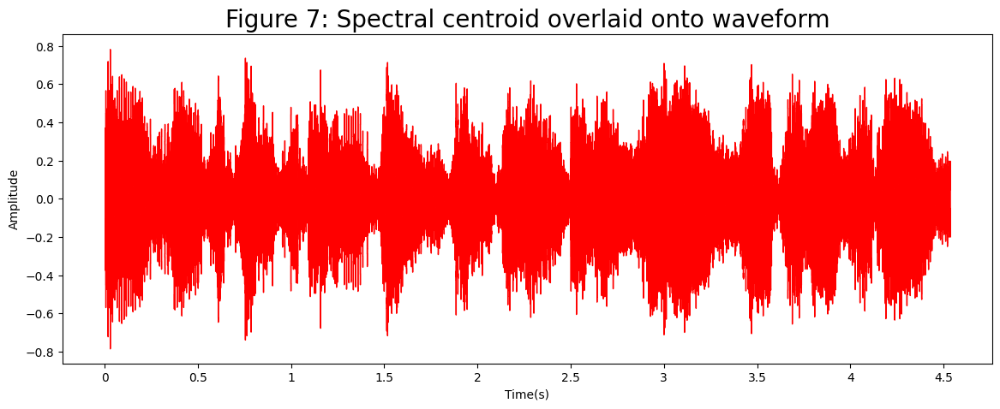

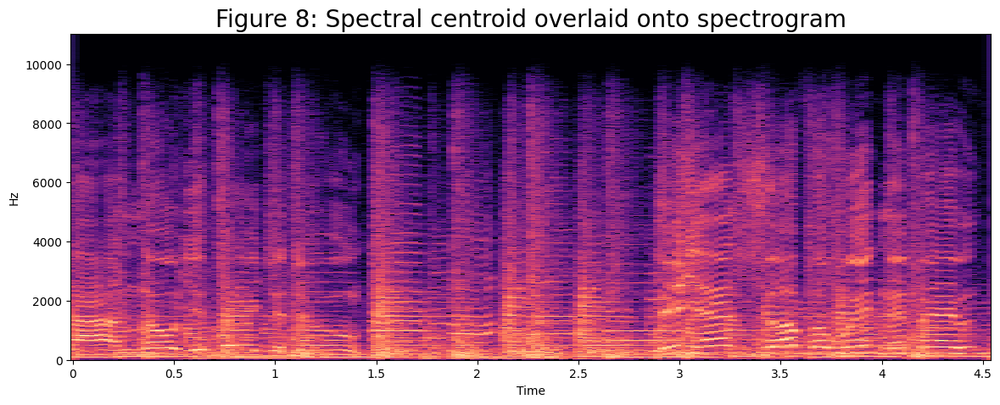

In [3]:
# Feature 2: Spectral Centroid 
## This feature represents taking a "slice" of a song and then taking the average of all frequencies at the
## point in time the slice represents. Extend this idea to ALL slices that make up a song, and
## using these averages plot a line that traverses exactly through each point, this is the Spectral Centroid
## of a song. This is important because two different genres may "generally" have a different spectral centroid line.

# Smaller Sample taken for demonstration below
n0 = 100000
n1 = 200000
x_sample = x[n0:n1]
spectral_centroids_sample = librosa.feature.spectral_centroid(y=x_sample, sr=sampling_rate)
#spectral_centroids_sample = librosa.feature.spectral_centroid(x_sample, sr=sampling_rate)[0]
spectral_centroids_sample.shape

frames = range(len(spectral_centroids_sample))
t = librosa.frames_to_time(frames)

# Normalize
def normalize(x_sample, axis=0):
    return sklearn.preprocessing.minmax_scale(x_sample, axis=axis)
plt.figure(figsize=(14,5))
librosa.display.waveshow(x_sample, sr=sampling_rate,color='r')

#librosa.display.waveplot(x_sample, sr=sampling_rate, alpha=0.4)
plt.title("Figure 7: Spectral centroid overlaid onto waveform",fontdict={'fontsize':20})
plt.xlabel("Time(s)")
plt.ylabel("Amplitude")
plt.plot(t, normalize(spectral_centroids_sample), color='r')


S_sample, phase_sample = librosa.magphase(librosa.stft(y=x_sample))
plt.figure(figsize = (14,5))
plt.title("Figure 8: Spectral centroid overlaid onto spectrogram",fontdict={'fontsize':20})
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
librosa.display.specshow(librosa.amplitude_to_db(S_sample, ref=np.max),y_axis='hz', x_axis='time')
plt.plot(t,spectral_centroids_sample, lw = 5.0, color='b')
plt.show()

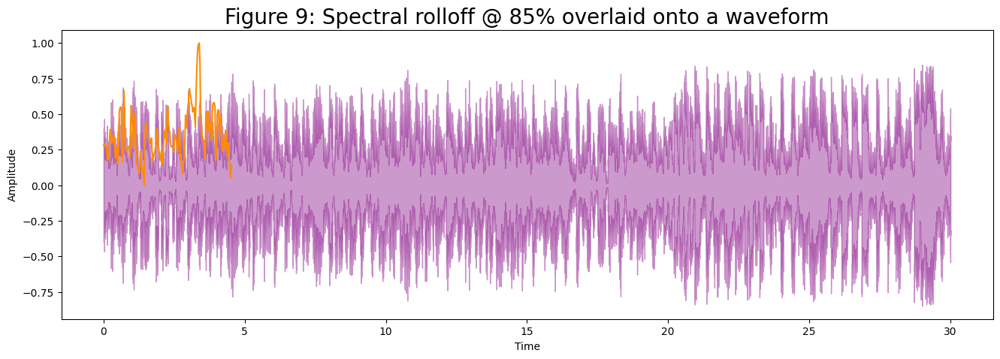

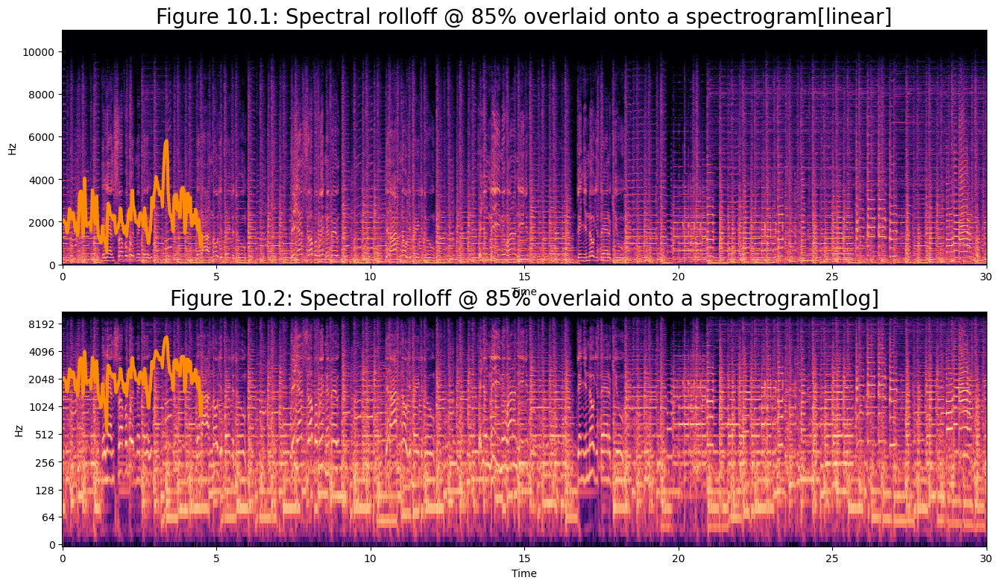

In [4]:
# Feature 3: Spectral Roll-off
## For a single slice of the stft the total "Energy" of all frequencies the it is composed of is always equal
## to "100%". Spectral-Roll off finds the frequency at which a certain given percentage of the energy is. For
## example, the Spectral Roll-Off at 85% of a song might be at 6000Hz. To find this value, it adds these composite
## frequencies in order of lowest frequencies in terms of Hz, to higher frequencies. This approach is applied to the
## entire song at each slice which ends up creating a series of points on a graph that are joined together by a line
## passing directly through all points to create the Spectral Roll-off.

## Spectral Roll Percent at 85% 

spectral_rolloff = librosa.feature.spectral_rolloff(y=x_sample+0.01, sr=sampling_rate, roll_percent=0.8)[0]

frames = range(len(spectral_rolloff))
t = librosa.frames_to_time(frames)

plt.figure(figsize=(16,5))
plt.title("Figure 9: Spectral rolloff @ 85% overlaid onto a waveform",fontdict={'fontsize':20})
plt.xlabel("Time(s)")
plt.ylabel("Amplitude")
librosa.display.waveshow(x, sr=sampling_rate, alpha=0.4,color='purple')
plt.plot(t, normalize(spectral_rolloff), color='darkorange')


plt.figure(figsize = (16,9))
plt.subplot(2,1,1)
plt.title("Figure 10.1: Spectral rolloff @ 85% overlaid onto a spectrogram[linear]",fontdict={'fontsize':20})
librosa.display.specshow(librosa.amplitude_to_db(S_spectogram, ref=np.max),y_axis='hz', x_axis='time')
plt.plot(t,spectral_rolloff, color='darkorange', lw=3)
plt.subplot(2,1,2)
plt.title("Figure 10.2: Spectral rolloff @ 85% overlaid onto a spectrogram[log]",fontdict={'fontsize':20})
librosa.display.specshow(librosa.amplitude_to_db(S_spectogram, ref=np.max),y_axis='log', x_axis='time')
plt.plot(t,spectral_rolloff, color='darkorange', lw=3)
plt.show()

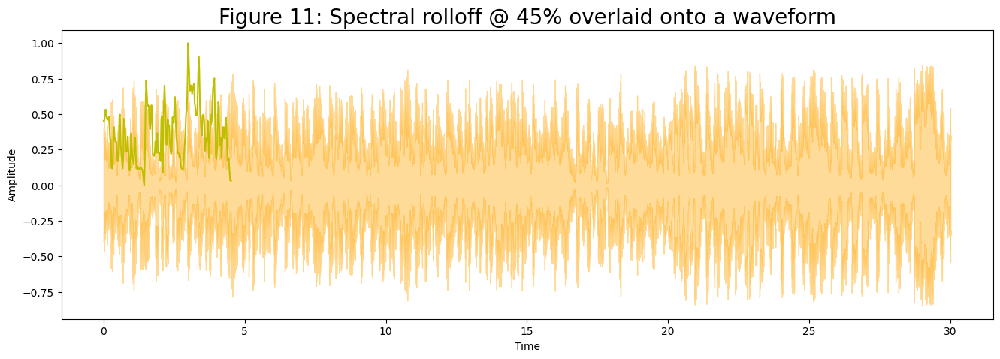

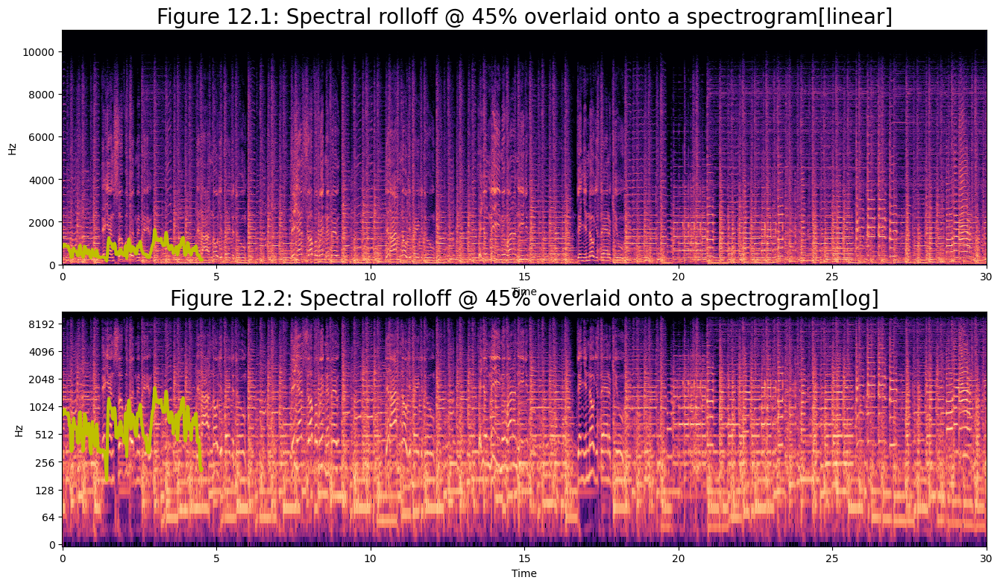

In [5]:
spectral_rolloff_2= librosa.feature.spectral_rolloff(y=x_sample+0.01, sr=sampling_rate, roll_percent=0.45)[0]
plt.figure(figsize=(16,5))
plt.title("Figure 11: Spectral rolloff @ 45% overlaid onto a waveform",fontdict={'fontsize':20})
plt.xlabel("Time(s)")
plt.ylabel("Amplitude")
librosa.display.waveshow(x, sr=sampling_rate, alpha=0.4,color='orange')
plt.plot(t, normalize(spectral_rolloff_2), color='y')

plt.figure(figsize = (16,9))
plt.subplot(2,1,1)
plt.title("Figure 12.1: Spectral rolloff @ 45% overlaid onto a spectrogram[linear]",fontdict={'fontsize':20})
librosa.display.specshow(librosa.amplitude_to_db(S_spectogram, ref=np.max),y_axis='hz', x_axis='time')
plt.plot(t,spectral_rolloff_2, color='y', lw=3)
plt.subplot(2,1,2)
plt.title("Figure 12.2: Spectral rolloff @ 45% overlaid onto a spectrogram[log]",fontdict={'fontsize':20})
librosa.display.specshow(librosa.amplitude_to_db(S_spectogram, ref=np.max),y_axis='log', x_axis='time')
plt.plot(t,spectral_rolloff_2, color='y', lw=3)
plt.show()

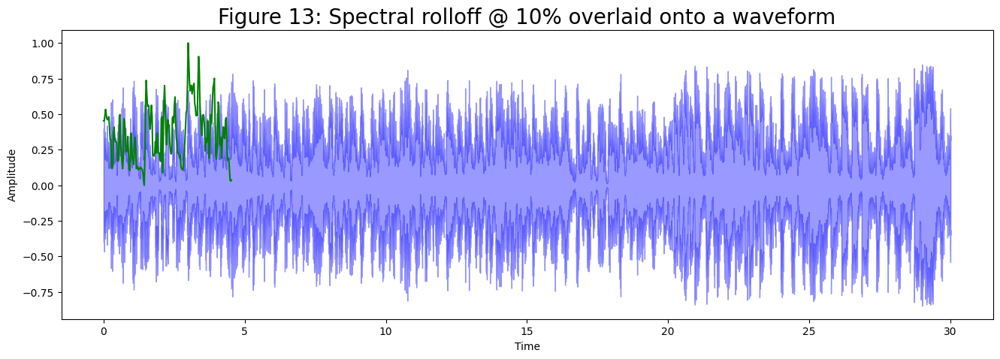

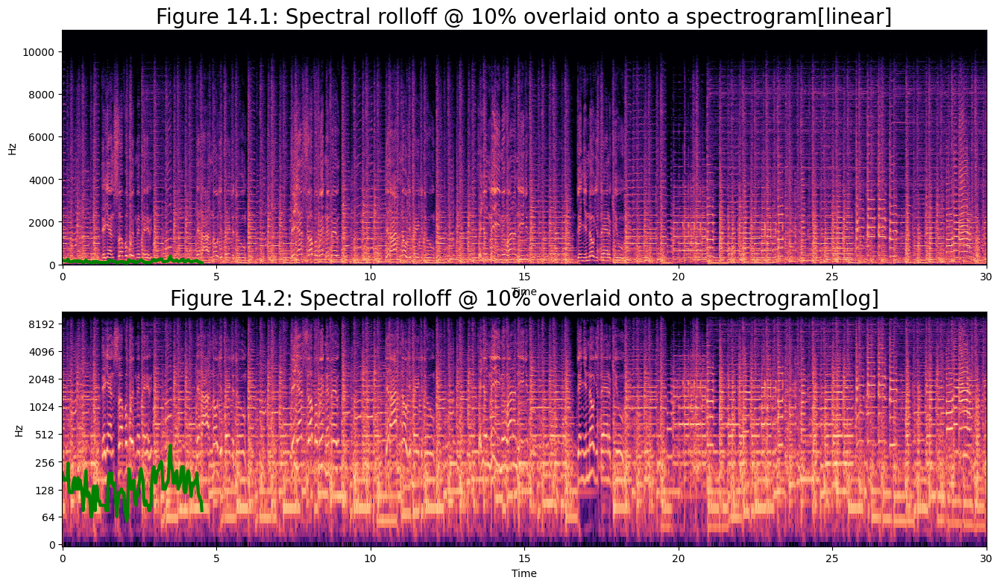

In [6]:
## Spectral Roll Percent at 10%
spectral_rolloff_3= librosa.feature.spectral_rolloff(y=x_sample+0.01, sr=sampling_rate, roll_percent=0.1)[0]
plt.figure(figsize=(16,5))
plt.title("Figure 13: Spectral rolloff @ 10% overlaid onto a waveform",fontdict={'fontsize':20})
plt.xlabel("Time(s)")
plt.ylabel("Amplitude")
librosa.display.waveshow(x, sr=sampling_rate, alpha=0.4,color='b')
plt.plot(t, normalize(spectral_rolloff_2), color='g')

plt.figure(figsize = (16,9))

plt.subplot(2,1,1)
plt.title("Figure 14.1: Spectral rolloff @ 10% overlaid onto a spectrogram[linear]",fontdict={'fontsize':20})
librosa.display.specshow(librosa.amplitude_to_db(S_spectogram, ref=np.max),y_axis='hz', x_axis='time')
plt.plot(t,spectral_rolloff_3, color='g', lw=3)
plt.subplot(2,1,2)
plt.title("Figure 14.2: Spectral rolloff @ 10% overlaid onto a spectrogram[log]",fontdict={'fontsize':20})
librosa.display.specshow(librosa.amplitude_to_db(S_spectogram, ref=np.max),y_axis='log', x_axis='time')
plt.plot(t,spectral_rolloff_3, color='g', lw=3)
plt.show()

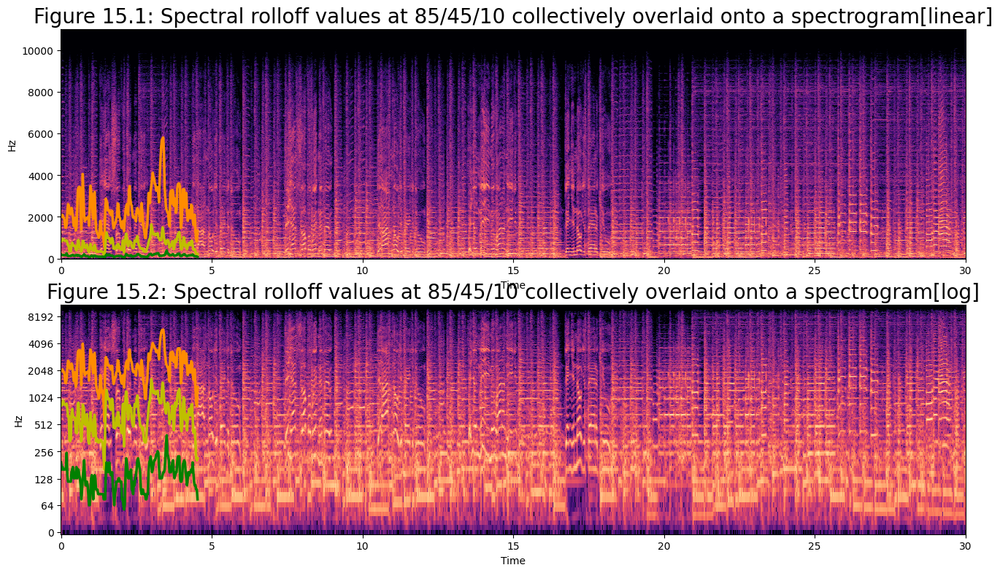

In [7]:
#Plotting the 3 different rolloffs percentages on the same graph both on a linear hz scale and a log hz scale
plt.figure(figsize = (16,9))
plt.subplot(2,1,1)
plt.title("Figure 15.1: Spectral rolloff values at 85/45/10 collectively overlaid onto a spectrogram[linear]",fontdict={'fontsize':20})
librosa.display.specshow(librosa.amplitude_to_db(S_spectogram, ref=np.max),y_axis='hz', x_axis='time')
plt.plot(t,spectral_rolloff, color='darkorange', lw=2.5)
plt.plot(t,spectral_rolloff_2, color='y', lw=2.5)
plt.plot(t,spectral_rolloff_3, color='g', lw=2.5)
plt.subplot(2,1,2)
plt.title("Figure 15.2: Spectral rolloff values at 85/45/10 collectively overlaid onto a spectrogram[log]",fontdict={'fontsize':20})
librosa.display.specshow(librosa.amplitude_to_db(S_spectogram, ref=np.max),y_axis='log', x_axis='time')
plt.plot(t,spectral_rolloff, color='darkorange', lw=2.5)
plt.plot(t,spectral_rolloff_2, color='y', lw=2.5)
plt.plot(t,spectral_rolloff_3, color='g', lw=2.5)
plt.show() 

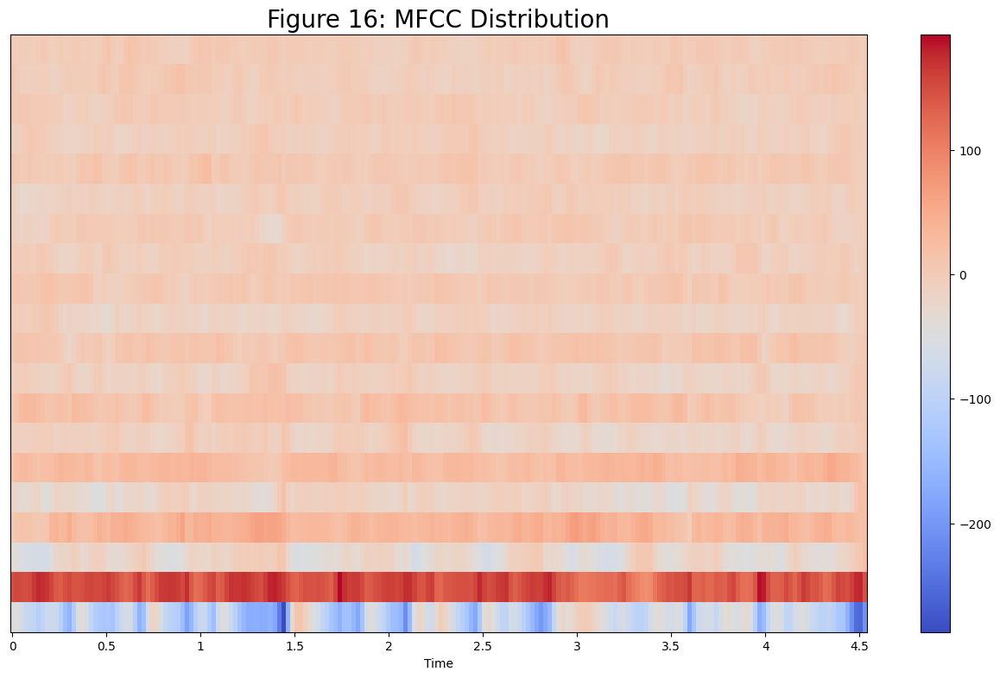

In [8]:
mfccs = librosa.feature.mfcc(y=x_sample, sr=sampling_rate)

plt.figure(figsize=(16,9))
plt.title("Figure 16: MFCC Distribution",fontdict={'fontsize':20})
plt.xlabel("Time(s)")
plt.ylabel("Bins")
librosa.display.specshow(mfccs, sr=sampling_rate, x_axis='time')
plt.colorbar()

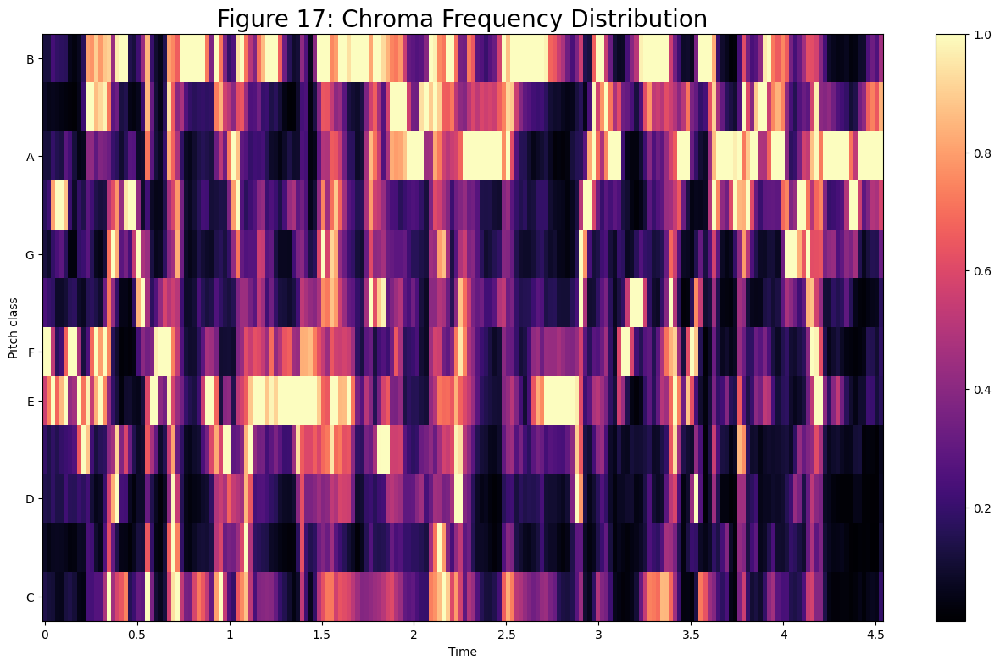

In [9]:
# Feature 5: Chroma Frequencies
## This feature represents: This will will divide the spectrum in to 12 distinct semitones that represent that
## represent a musical octave, for the entire song.

chromagram = librosa.feature.chroma_stft(y=x_sample, sr=sampling_rate )
plt.figure(figsize=(16,9))
plt.title("Figure 17: Chroma Frequency Distribution",fontdict={'fontsize':20})
plt.xlabel("Time(s)")
plt.ylabel("Semitones")
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma')
plt.colorbar()
plt.magma()

In [10]:
## baseline_waveform_512_subset extracts the waveform of each song. To do so, it loads the song and then takes the average
## value for every 512 sample points and creates one point for them, thus compressing the sample to a more manageable size.
## It is possible to simply take a different sampling rate by passing the parameter to the load() function, however, we
## wanted to know exactly how it was being resampled and there is limited documentation about resampy's ‘kaiser_best’.
## After compressing, we add the new sample point to the list wave_form_downsize and continue iterating through until the
## entire song has been sampled.

def baseline_waveform_512_subset(songFilePath,startTime,duration):
    x , sampling_rate = librosa.load(songFilePath, offset= startTime, duration=duration)
    wave_form_downsize = []
    start_point = 0

    for i in range (0,(math.floor(x.shape[0]/512))):
        sum_512=0.0
        for j in range (start_point, start_point + 512):
            sum_512+=x[j]
        wave_form_downsize.append(float(sum_512/512))
        start_point+=512
    return wave_form_downsize
    

## Create a csv file into which the sampled waveform will be written. The file will include a column for the filename,
## genre, and each of the sampled values.
def csvCreatorBaseline (file_name,size):
    header_elements =["filename "]
    for l in range (1, size+1):
        header_elements.append(f' waveform slice {l}')
    header_elements.append('genre')
    file = open(file_name,'w', newline='')
    with file:
        writer = csv.writer(file)
        writer.writerow(header_elements)
        
## CSV Appendor Method for adding the extrated music feautres to the CSV File. Appends the sampled values into the CSV
## file.
def csvAppendorBaseline (csvFile_name, waveform_512_split, song_file_path, genre):
    to_append =f'{song_file_path}'
    to_append += " "
    for i in range(0,len(waveform_512_split)):
        to_append += str(waveform_512_split[i])
        to_append +=" "
    to_append += " "
    to_append += genre
    file = open(csvFile_name, 'a', newline='')  
    with file:
        writer = csv.writer(file)
        writer.writerow(to_append.split())
                

In [11]:
## Calculates how many sample points each file will have. The number of sample points will depend on the length of the
## sample chosen and we have decided to take 5, 10, and 20 second samples of each song in order to compare how they 
## perform. Since each is sampled at the same rate, the longer samples will have more points.
second_5=math.floor((5*22050)/512)
second_10=math.floor((10*22050)/512)
second_20=math.floor((20*22050)/512)
import warnings
warnings.filterwarnings('ignore')
## Call the csvCreatorBaseline method to generate 3 different CSV files, one for each sample length.
csvCreatorBaseline("baseline_5sec.csv",second_5)
csvCreatorBaseline("baseline_10sec.csv",second_10)
csvCreatorBaseline("baseline_20sec.csv",second_20)

## Create a list of the 10 genres in the dataset to iterate through
genres = ["blues","classical","country","disco","hiphop","jazz","metal","pop","reggae","rock"]

file_path_b='genres_original/'

## Iterate through the list of genres and for each one, open the folder containing its songs and for every song,
## create a 5, 10, and 20 second sample and write those samples into their respective CSV file.
print("Start")
count=0
for x in genres:
    file_path_g= file_path_b + x +'/'+x +'.000'

    for y in range(0, 100):
        y_string = str(y)
        file_path_s = file_path_g + y_string.rjust(2,'0') + '.wav'
        
        #extracting baseline from 5 seconds
        baseline_512_split_5= baseline_waveform_512_subset(file_path_s,12.5,5)
        csvAppendorBaseline("baseline_5sec.csv",  baseline_512_split_5,file_path_s[file_path_s.rfind('/')+1:], x)
        
        #extracting baseline from 10 seconds
        baseline_512_split_10= baseline_waveform_512_subset(file_path_s,10,10)
        csvAppendorBaseline("baseline_10sec.csv",  baseline_512_split_10,file_path_s[file_path_s.rfind('/')+1:], x)
        
        #extracting baseline from 20 seconds
        baseline_512_split_20= baseline_waveform_512_subset(file_path_s,5,20)
        csvAppendorBaseline("baseline_20sec.csv",  baseline_512_split_20,file_path_s[file_path_s.rfind('/')+1:], x)
        if count%100 == 0:
            print(count)
        count+=1
                
        
print("End")

Start
0
100
200
300
400
500


NoBackendError: 

In [ ]:

def csvCreatorFiveFeat (file_name):
    header_elements =["filename ", "spectral_centroid ",  "rolloff ", "zero_crossing_rate"]
    pitch = ["c", "c#", "d", "d#","e", "f", "f#", "g", "g#", "a", "a#", "b"]
    header=''
    for l in range (1, 21):
        header_elements.append(f' mfcc{l}')
    for i in range (1,13):
        header_elements.append(f"chroma_pitch_{pitch[i-1]}") 
    header_elements.append('genre')
    file = open(file_name,'w', newline='')
    with file:
        writer = csv.writer(file)
        writer.writerow(header_elements)


        
## CSV Appendor Method for adding the extrated music feautres to the CSV File. It takes as input each of the features
## as well as the name of the CSV file they will be added to, and then appends each.
def csvAppendor (csvFile, zcr, spectral_centroids, spectral_rolloff, mfccs, chroma, song_file_path, genre):
    to_append =f'{song_file_path} {np.mean(spectral_centroids)} {np.mean(spectral_rolloff)} {sum(zcr)}'   
    for e in mfccs:
        to_append += f' {np.mean(e)}'
    for h in chroma:
        to_append += f' {np.mean(h)}'
    to_append += " "
    to_append += genre
    file = open(csvFile, 'a', newline='')  
    with file:
        writer = csv.writer(file)
        writer.writerow(to_append.split())



## Feature Extraction Method. The location of the song file is determined by songFilePath and the sample is taken
## from startPoint and has a length determined by duration. rollPercent represents the percentage at which we want
## to calculate the spectral rolloff, as explained earlier in this notebook.

def featureExtractor (songFilePath, startTime, duration,rollPercent):
    x , sampling_rate = librosa.load(songFilePath, offset= startTime, duration=duration)
    zcr = librosa.zero_crossings(x)
    spectral_centroids = librosa.feature.spectral_centroid(y=x_sample, sr=sampling_rate)[0]
    spectral_rolloff = librosa.feature.spectral_rolloff(y=x_sample+0.01, sr=sampling_rate, roll_percent=rollPercent)[0]
    mfccs = librosa.feature.mfcc(y=x_sample, sr=sampling_rate)
    chroma = librosa.feature.chroma_stft(y=x_sample, sr=sampling_rate)
    
    return zcr, spectral_centroids, spectral_rolloff, mfccs, chroma

In [ ]:
import csv

In [ ]:

csvCreatorFiveFeat('feature_extraction_5sec.csv')
csvCreatorFiveFeat('feature_extraction_10sec.csv')
csvCreatorFiveFeat('feature_extraction_20sec.csv')


## Create a list of the 10 genres in the dataset to iterate through
genres = ["blues","classical","country","disco","hiphop","jazz","metal","pop","reggae","rock"]

file_path_b='genres_original/'

## Iterate through the list of genres and for each one, open the folder containing its songs and for every song,
## create a 5, 10, and 20 second sample and write those samples into their respective CSV file.
print("Start")
for x in genres:
    file_path_g= file_path_b + x +'/'+x +'.000'

    for y in range(0, 100):
        y_string = str(y)
        file_path_s = file_path_g + y_string.rjust(2,'0') + '.wav'
        
        #extracting features from 5 seconds
        zcr, spectral_centroids, spectral_rolloff, mfccs, chroma = featureExtractor(file_path_s, 12.5,5,0.85)
        csvAppendor('feature_extraction_5sec.csv',zcr, spectral_centroids, spectral_rolloff, mfccs, chroma, file_path_s[file_path_s.rfind('/')+1:], x)
         #extracting features from 10 seconds
        zcr, spectral_centroids, spectral_rolloff, mfccs, chroma = featureExtractor(file_path_s, 10,10,0.85)
        csvAppendor('feature_extraction_10sec.csv',zcr, spectral_centroids, spectral_rolloff, mfccs, chroma, file_path_s[file_path_s.rfind('/')+1:], x)
         #extracting features from 10 seconds
        zcr, spectral_centroids, spectral_rolloff, mfccs, chroma = featureExtractor(file_path_s, 5,20,0.85)
        csvAppendor('feature_extraction_20sec.csv',zcr, spectral_centroids, spectral_rolloff, mfccs, chroma, file_path_s[file_path_s.rfind('/')+1:], x)
    print(x)
print("End")


In [ ]:
pip install librosa

In [ ]:

csvCreatorFiveFeat('feature_extraction_5sec.csv')
csvCreatorFiveFeat('feature_extraction_10sec.csv')
csvCreatorFiveFeat('feature_extraction_20sec.csv')


## Create a list of the 10 genres in the dataset to iterate through
genres = ["blues","classical","country","disco","hiphop","jazz","metal","pop","reggae","rock"]

file_path_b='genres_original/'

## Iterate through the list of genres and for each one, open the folder containing its songs and for every song,
## create a 5, 10, and 20 second sample and write those samples into their respective CSV file.
print("Start")
for x in genres:
    file_path_g= file_path_b + x +'/'+x +'.000'

    for y in range(0, 100):
        y_string = str(y)
        file_path_s = file_path_g + y_string.rjust(2,'0') + '.wav'
        
        #extracting features from 5 seconds
        zcr, spectral_centroids, spectral_rolloff, mfccs, chroma = featureExtractor(file_path_s, 12.5,5,0.85)
        csvAppendor('feature_extraction_5sec.csv',zcr, spectral_centroids, spectral_rolloff, mfccs, chroma, file_path_s[file_path_s.rfind('/')+1:], x)
         #extracting features from 10 seconds
        zcr, spectral_centroids, spectral_rolloff, mfccs, chroma = featureExtractor(file_path_s, 10,10,0.85)
        csvAppendor('feature_extraction_10sec.csv',zcr, spectral_centroids, spectral_rolloff, mfccs, chroma, file_path_s[file_path_s.rfind('/')+1:], x)
         #extracting features from 10 seconds
        zcr, spectral_centroids, spectral_rolloff, mfccs, chroma = featureExtractor(file_path_s, 5,20,0.85)
        csvAppendor('feature_extraction_20sec.csv',zcr, spectral_centroids, spectral_rolloff, mfccs, chroma, file_path_s[file_path_s.rfind('/')+1:], x)
    print(x)
print("End")

In [ ]:
pip install librosa

In [ ]:
# Read the data from the baseline CSV into a pandas DataFrame and then display the first 110 rows
X = pd.read_csv("baseline_5sec.csv")
X.head(110)

In [ ]:

def read_data(file_name):
    data = pd.read_csv(file_name)
    #print("*BEFORE* Shape of data file \"{0}\" is: {1}".format(file_name, data.shape))
    return data

def create_genre_list(data):
    genre_list = data.iloc[:, -1]
    return genre_list

# Encoding occurs in here
def get_y_value(data):
    genre_list = create_genre_list(data)
    encoder = preprocessing.LabelEncoder()
    y = encoder.fit_transform(genre_list)
    return y

# Scaling occurs in here
def get_x_value(data):
    data = data.drop(['filename '],axis=1)
    data = data.drop(['genre'],axis=1)
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(np.array(data.iloc[:, :-1], dtype = float))
    #print("*AFTER* Shape of data file is: {0}".format(data.shape))
    return X


def get_baseline_file_names():
    return ["baseline_5sec.csv",
            "baseline_10sec.csv",
            "baseline_20sec.csv"]

def get_5_feature_file_names():
    return ["feature_extraction_5sec.csv",
            "feature_extraction_10sec.csv",
            "feature_extraction_20sec.csv"]

In [ ]:
def create_and_run_nn(X_train, X_test, y_train, y_test):
    model = models.Sequential()
    model.add(layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(10, activation='softmax'))
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    hist = model.fit(X_train,
                    y_train,
                    epochs=20,
                    verbose=0,
                    batch_size=32)

    # Get Accuracy
    test_loss, test_acc = model.evaluate(X_test,y_test)
    #print(test_acc)
    import numpy as np
    import tensorflow as tf
    model = tf.keras.metrics.BinaryAccuracy()
    model.update_state([[1], [1], [0], [0]], [[0.98], [1], [0], [0.6]])
    model.result().numpy()
    
    model.reset_state()
    model.update_state([[1], [1], [0], [0]], [[0.98], [1], [0], [0.6]], sample_weight=[1, 0, 0, 1])
    model.result().numpy()
    #model.reset_states()
    return test_acc

def train_and_eval(file, num_iterations=1, num_features = 5):
    # Generates the results for Baseline and 5 feature NN with same hyperparameter setup
    i = 0
    acc_list = []
    while i < num_iterations:
        data = read_data(file)
        y = get_y_value(data)

        # Used only to handle if 3 features, else assumes it is 5 feature case
        if num_features == 3:
            X = get_x_value_3_feature(data)
        else:
            X = get_x_value(data)
            
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
        test_acc_result = create_and_run_nn(X_train, X_test, y_train, y_test)
        acc_list.append(test_acc_result)
        i += 1
    return acc_list

In [ ]:
# Gathers statistics on test accuracy list, and passes them to a print function
def get_statistics(acc_list, song_length=5, num_features=0):
    mean = statistics.mean(acc_list)
    min_res = min(acc_list)
    max_res = max(acc_list)
    print_results(song_length, mean, min_res, max_res, num_features)
    
# Prints out formatted statistics
def print_results(song_length, mean, min_res, max_res, num_features=0):
    if num_features == 0:
        print("Baseline file with {0} second song clips, scored a mean test accuracy of: {1}".format(song_length, mean))
    elif num_features == 3:
        print("3 Feature file with {0} second song clips, scored a mean test accuracy of: {1}".format(song_length, mean))
    else:
        print("5 Feature file with {0} second song clips, scored a mean test accuracy of: {1}".format(song_length, mean))
    print("With a Min score of: {0}  ---  Max score of: {1}".format(min_res, max_res))
    print("---------------------------------------------------------------------------")

In [ ]:
def run_nn_main_baseline(num_iterations=1):
    files_baseline = get_baseline_file_names()
    
    
    # Generate test accuracy results of baseline for num_iteration times
    for i in range(len(files_baseline)):
        if i == 0:
            acc_list_b_5sec = train_and_eval(files_baseline[i], num_iterations)
            get_statistics(acc_list_b_5sec, 5)
            
        if i == 1:
            acc_list_b_10sec = train_and_eval(files_baseline[i], num_iterations)
            get_statistics(acc_list_b_10sec, 10)

        if i == 2:
            acc_list_b_20sec = train_and_eval(files_baseline[i], num_iterations)
            get_statistics(acc_list_b_20sec, 20)

            
run_nn_main_baseline(2) 


   

In [ ]:
def gen_rand_hidden_units():
    return 2 ** random.randint(2,8)                # finds the k value in 2^k. Limited to 8 since not a lot of data.

def setup_randomized_attributes():
    batch_size = 2 ** random.randint(2, 7)              # finds the k value in 2^k. Limited to 7 since small data set.
    num_hidden_layers = random.randint(2, 5)       # Neural network can have 1 - 5 hidden layers plus initial and last
    hidden_layer_info = []
    
    i = 0
    while i < num_hidden_layers:
        hidden_layer_info.append(gen_rand_hidden_units())
        i += 1
    
    return hidden_layer_info, batch_size

In [ ]:
# Understanding the randomized attribues.
#  - The First List: Each integer represents the number of hidden units of that layer. 
#                    The total number of integers represents how many hidden layers exist.
#  - The second value: represents the batch size

result = setup_randomized_attributes()
print(result)

In [ ]:
# These modified versions will use a different instantiated random attributes for each run through
def create_and_run_nn_randomized(X_train, X_test, y_train, y_test):
    hidden_layer_info, rand_batch_size = setup_randomized_attributes()
    num_layers = len(hidden_layer_info)
    model = models.Sequential()
    i = 0

    model.add(layers.Dense(hidden_layer_info[0], activation='relu', input_shape=(X_train.shape[1],)))
    while i < num_layers:
        model.add(layers.Dense(hidden_layer_info[i], activation='relu'))
        i += 1
    model.add(layers.Dense(10, activation='softmax'))
    
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Uses a randomized 2^k batch size
    hist = model.fit(X_train,
                    y_train,
                    epochs=20,
                    verbose=0,
                    batch_size=rand_batch_size)
    
    # Get Accuracy
    test_loss, test_acc = model.evaluate(X_test,y_test)
    #print(test_acc)
    import numpy as np
    import tensorflow as tf
    
    model = tf.keras.metrics.BinaryAccuracy()
    model.update_state([[1], [1], [0], [0]], [[0.98], [1], [0], [0.6]])
    model.result().numpy()
    
    model.reset_state()
    model.update_state([[1], [1], [0], [0]], [[0.98], [1], [0], [0.6]], sample_weight=[1, 0, 0, 1])
    model.result().numpy()
    #model.reset_states()
    #model.layers[1].reset_states()
    return test_acc, hidden_layer_info, rand_batch_size

def train_and_eval_randomized(file, num_randomizations=10):
    i = 0
    acc_list = []
    while i < num_randomizations:
        data = read_data(file)
        y = get_y_value(data)
        X = get_x_value(data)
            
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
        test_acc_result, hidden_layer_info, batch_size = create_and_run_nn_randomized(X_train, X_test, y_train, y_test)
        acc_list.append((test_acc_result, hidden_layer_info, batch_size))
        i += 1
    return acc_list

In [ ]:
# Gathers statistics on test accuracy list, and passes them to a print function
def get_statistics_randomized(acc_list, song_length=5, num_iterations=10):
    sorted_list = sorted(acc_list, key = lambda x: x[0])
    max_res = sorted_list[-5:]                      # Sorted Largest, 2nd largest.. 5th largest.
    min_res = sorted_list[:5]                       # Sorted Smallest, 2nd smallest... 5th smallest.
    print_results_randomized(song_length, min_res, max_res)
    
# Prints out formatted statistics
def print_results_randomized(song_length, min_res, max_res):
    print("The 5 worst results of {0} length songs, have an accuracy and hyperparameters of the following: ".format(song_length))
    for i in range(len(min_res)):
        print ("Accuracy: {0} || Batch Size: {1} -- Hidden Layer Info: {2}".format(min_res[i][0], min_res[i][2], min_res[i][1]))
        
    print("")
    print("The 5 best results of {0} length songs, have an accuracy and hyperparameters of the following: ".format(song_length))
    for i in range(len(max_res)):
        print ("Accuracy: {0} || Batch Size: {1} -- Hidden Layer Info: {2}".format(max_res[i][0], max_res[i][2], max_res[i][1]))

    print("--------------------------------------------------------------------------------------------------------------")

In [ ]:
def run_nn_main_randomized(num_randomizations=10):
    files_5f = get_5_feature_file_names()

    for i in range(len(files_5f)):

        if i == 0:
            acc_list_5f_5sec = train_and_eval_randomized(files_5f[i], num_randomizations)
            get_statistics_randomized(acc_list_5f_5sec, 5, 5)

        if i == 1:
            acc_list_5f_10sec = train_and_eval_randomized(files_5f[i], num_randomizations)
            get_statistics_randomized(acc_list_5f_10sec, 10, 5)

        if i == 2:
            acc_list_5f_20sec = train_and_eval_randomized(files_5f[i], num_randomizations)
            get_statistics_randomized(acc_list_5f_20sec, 20, 5) 
run_nn_main_randomized(10)